#### Подготовка среды

In [1]:
import json
from typing import List

import numpy as np
from joblib import Parallel, delayed

from time_series import TimeSeries
from user_interface import InputParams, process_cli

In [2]:
def get_files_names(params: InputParams) -> List[str]:
    """
    Возвращает список имён файлов с данными
    """
    if params.tickets_group:
        with open('configuration.json', 'r') as file:
            configuration = json.load(file)
        return configuration['tickets_groups'][params.tickets_group]
    else:
        return params.files_names

def process_ts(file_name: str, time_series_params: dict) -> TimeSeries:
    """
    Обработка одного временного ряда
    time_series_params — словарь параметров для обработки временного ряда
    """
    ts = TimeSeries(file_name=file_name, **time_series_params)
    ts.process()
    return ts

#### Начало обработки данных

In [3]:
params = InputParams(
    directory = 'data',
    files_names = None,
    tickets_group = 'NDXT_30',
    file_extension = 'csv',
    time_column = 'date',
    processed_columns = ['open', 'close'],
    target_frequency = 'H',
    frequency_method = 'mean',
    missing_method = 'rolling',
    anomaly_method = 'rolling',
    rolling_window = 2,
    z_threshold = 3.0,
    decompose_model = 'additive',
    decompose_period = None
)

In [4]:
files_names = get_files_names(params)

time_series_params = dict(
    directory=params.directory,
    file_extension=params.file_extension,
    time_column=params.time_column,
    processed_columns=params.processed_columns,
    target_frequency=params.target_frequency,
    frequency_method=params.frequency_method,
    missing_method=params.missing_method,
    anomaly_method=params.anomaly_method,
    rolling_window=params.rolling_window,
    z_threshold=params.z_threshold,
    decompose_model=params.decompose_model,
    decompose_period=params.decompose_period
)

In [5]:
# Параллельная обработка временных рядов
time_series: List[TimeSeries] = Parallel(n_jobs=-1, backend='threading', verbose=10)(
    delayed(process_ts)(file_name, time_series_params)
    for file_name in files_names
)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done  11 out of  30 | elapsed:    0.9s remaining:    1.6s
[Parallel(n_jobs=-1)]: Done  15 out of  30 | elapsed:    1.7s remaining:    1.7s
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:    1.7s remaining:    1.0s
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:    1.8s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:    2.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    2.2s finished


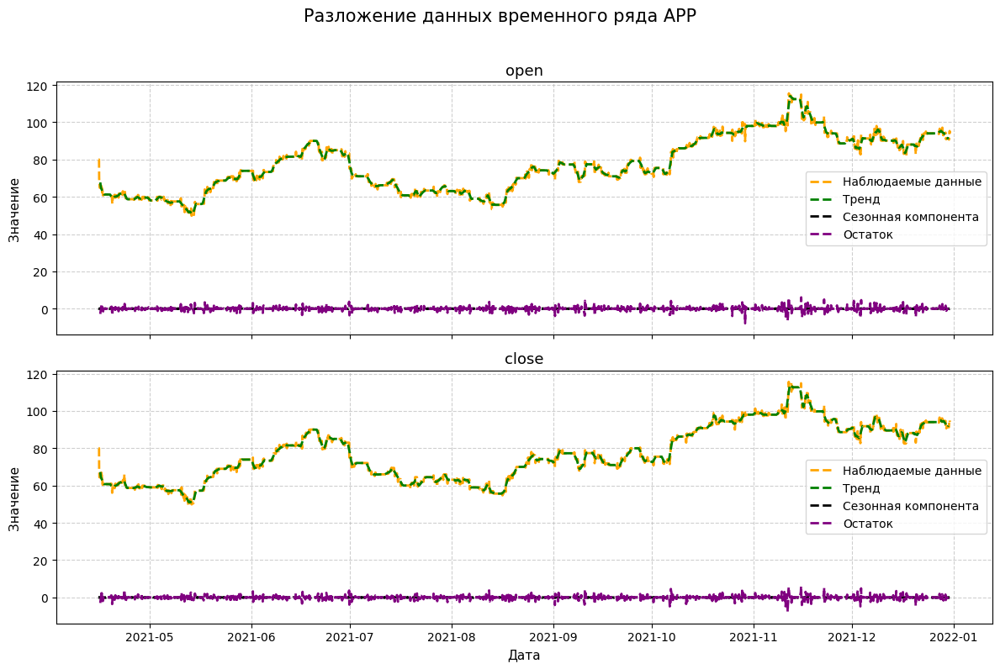

In [6]:
# После обработки визуализируем один тикет
for ts in time_series:
    if ts.file_name == 'APP':
        app__ticket = ts
        ts.show()

#### Генерация признаков

In [7]:
#Календарные признаки
app__ticket.data_transformed["day"] = app__ticket.data_transformed.index.day
app__ticket.data_transformed["dayofweek"] = app__ticket.data_transformed.index.dayofweek  # 0-6
app__ticket.data_transformed["weekofyear"] = app__ticket.data_transformed.index.isocalendar().week.astype(int)
app__ticket.data_transformed["month"] = app__ticket.data_transformed.index.month
app__ticket.data_transformed["quarter"] = app__ticket.data_transformed.index.quarter

In [8]:
#Циклические признаки
app__ticket.data_transformed["dow_sin"] = np.sin(2*np.pi * app__ticket.data_transformed.index.dayofweek / 7)
app__ticket.data_transformed["dow_cos"] = np.cos(2*np.pi * app__ticket.data_transformed.index.dayofweek / 7)
app__ticket.data_transformed["month_sin"] = np.sin(2*np.pi * app__ticket.data_transformed.index.month / 12)
app__ticket.data_transformed["month_cos"] = np.cos(2*np.pi * app__ticket.data_transformed.index.month / 12)
app__ticket.data_transformed["dayofyear_sin"] = np.sin(2*np.pi * app__ticket.data_transformed.index.dayofyear / 365)
app__ticket.data_transformed["dayofyear_cos"] = np.cos(2*np.pi * app__ticket.data_transformed.index.dayofyear / 365)
app__ticket.data_transformed["hour_sin"] = np.sin(2*np.pi * app__ticket.data_transformed.index.hour / 24)
app__ticket.data_transformed["hour_cos"] = np.cos(2*np.pi * app__ticket.data_transformed.index.hour / 24)

In [9]:
app__ticket.data_transformed.style

,open,close,day,dayofweek,weekofyear,month,quarter,dow_sin,dow_cos,month_sin,month_cos,dayofyear_sin,dayofyear_cos,hour_sin,hour_cos
date,,,,,,,,,,,,,,,
2021-04-15 13:00:00+00:00,80.000000,80.000000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.258819,-0.965926
2021-04-15 14:00:00+00:00,80.000000,80.000000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.500000,-0.866025
2021-04-15 15:00:00+00:00,80.000000,80.000000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.707107,-0.707107
2021-04-15 16:00:00+00:00,80.000000,80.000000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.866025,-0.500000
2021-04-15 17:00:00+00:00,70.000000,67.820000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.965926,-0.258819
2021-04-15 18:00:00+00:00,67.820000,66.930000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-1.000000,-0.000000
2021-04-15 19:00:00+00:00,66.930000,64.445000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.965926,0.258819
2021-04-15 20:00:00+00:00,65.200000,64.990000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.866025,0.500000
2021-04-15 21:00:00+00:00,64.960000,65.000000,15,3,15,4,2,0.433884,-0.900969,0.866025,-0.500000,0.972118,-0.234491,-0.707107,0.707107


In [10]:
#Признаки сезонности

for column in params.processed_columns:
    #сила сезонного эффекта
    app__ticket.data_decomposed[f"{column}__seasonal__abs"] = app__ticket.data_decomposed[f"{column}__seasonal"].abs()
    #фаза сезонности
    app__ticket.data_decomposed[f"{column}__seasonal__phase"] = app__ticket.data_decomposed[f"{column}__seasonal"].rank(pct=True)
    #дельта сезонности
    app__ticket.data_decomposed[f"{column}__seasonal__diff"] = app__ticket.data_decomposed[f"{column}__seasonal"].diff()
    #нормализованная сезонность
    app__ticket.data_decomposed[f"{column}__seasonal__scaled"] = (
        app__ticket.data_decomposed[f"{column}__seasonal"]
        - app__ticket.data_decomposed[f"{column}__seasonal"].mean()
    ) / app__ticket.data_decomposed[f"{column}__seasonal"].std()

In [11]:
app__ticket.data_decomposed.style

,open__observed,open__trend,open__seasonal,open__resid,close__observed,close__trend,close__seasonal,close__resid,open__seasonal__abs,open__seasonal__phase,open__seasonal__diff,open__seasonal__scaled,close__seasonal__abs,close__seasonal__phase,close__seasonal__diff,close__seasonal__scaled
date,,,,,,,,,,,,,,,,
2021-04-15 13:00:00+00:00,80.000000,nan,0.055059,nan,80.000000,nan,-0.013424,nan,0.055059,0.937430,nan,1.202602,0.013424,0.271406,nan,-0.261750
2021-04-15 14:00:00+00:00,80.000000,nan,0.000934,nan,80.000000,nan,-0.004025,nan,0.000934,0.562811,-0.054124,0.020582,0.004025,0.354779,0.009399,-0.077925
2021-04-15 15:00:00+00:00,80.000000,nan,-0.000093,nan,80.000000,nan,-0.142105,nan,0.000093,0.521044,-0.001028,-0.001865,0.142105,0.020964,-0.138081,-2.778461
2021-04-15 16:00:00+00:00,80.000000,nan,-0.121872,nan,80.000000,nan,-0.043491,nan,0.121872,0.020964,-0.121778,-2.661374,0.043491,0.188032,0.098615,-0.849790
2021-04-15 17:00:00+00:00,70.000000,nan,-0.019302,nan,67.820000,nan,-0.081587,nan,0.019302,0.229478,0.102570,-0.421351,0.081587,0.062731,-0.038096,-1.594865
2021-04-15 18:00:00+00:00,67.820000,nan,-0.053945,nan,66.930000,nan,-0.069038,nan,0.053945,0.062731,-0.034643,-1.177928,0.069038,0.104498,0.012549,-1.349427
2021-04-15 19:00:00+00:00,66.930000,nan,-0.044933,nan,64.445000,nan,-0.061042,nan,0.044933,0.104498,0.009012,-0.981111,0.061042,0.146265,0.007996,-1.193051
2021-04-15 20:00:00+00:00,65.200000,nan,-0.011010,nan,64.990000,nan,0.058561,nan,0.011010,0.312851,0.033923,-0.240277,0.058561,0.895823,0.119603,1.146103
2021-04-15 21:00:00+00:00,64.960000,nan,0.144748,nan,65.000000,nan,0.105684,nan,0.144748,0.979197,0.155759,3.161335,0.105684,0.979197,0.047123,2.067714
